<a href="https://colab.research.google.com/github/saimani5/VAE-tutorials/blob/main/crvae_graphene.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

*   This notebook takes you through the application of rotationally invariant conditional variational autoencoder (crVAE) on STEM image of silicon in graphene manipulated by e-beam activation.  
*   The dataset consists of 50 different STEM images of silicon in graphene.
*   The dataset is initially passed through semantic segmentation DCNN network which classifies each pixel in an image into 3 different classes (C-atom, Si-atom, and background)
*   Since crVAE requires knowing the ground-truth targets apriori, we divide the sub-images (inputs) into 7 different classes based on the type and number of graphene rings present in the sub-image.
*   We understand that the labeling process used comes with its incompetencies, but it is a quick, autonomous way of labeling the graphene images.

*   conditional autoencoder conditions the encoding-decoding of each image on its ground truth class. 
*   So, we form m independent latent spaces for a given dataset, where m is the number of classes present in the dataset
*   On top of this cVAE (from pyroved) can also be used to condition the encodings on a continuous ground truth property associated with each data point. This is not discussed in this notebook.
*   rVAE comprises of an additional latent dimension to the regular VAE, which explicitly captures the rotations involved in the image.
*   This angular latent dimension is unsupervisedly learned while trying to reconstuct the original image.
*   Like in VAE, this latent dimension is also regularized using a prior.  

The crVAEs are defined and trained using a package called Pyroved (https://github.com/ziatdinovmax/pyroVED) which is built on top of Pyro probabilistic programming framework. Please feel free to write to valletisai.mani@gmail.com for further enquiries.

In [ ]:
# Installing Kornia, pyroved and atomai
!pip install -q kornia git+https://github.com/saimani5/atomai@master git+https://github.com/saimani5/pyroVED@main gdown==4.5.4

  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 612.0/612.0 KB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.5/11.5 MB 19.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.1/193.1 KB 8.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 503.1/503.1 KB 20.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 730.7/730.7 KB 40.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 865.8/865.8 KB 16.5 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
plotnine 0.10.1 requires matplotlib>=3.5.0, but you have matplotlib 3.3.4 which is incompatible.
mizani 0.8.1 requires matplotlib>=3.5.0, but you have matplotlib 3.3.4 which is incompatible.


In [ ]:
# Download the dataset, Will explain what each file corresponds to later
!gdown https://drive.google.com/uc?id=1-JZSRjIjNjkR0ZQ8ffRDAZ2FID53Yhon
!gdown https://drive.google.com/uc?id=1-84vLdGFsimD1jaTcGcMzNRCSvjId7-Y
!gdown https://drive.google.com/uc?id=1-Lowglj7fwEFaJoC9EBKDyfCIsMgOnyu

Downloading...
From: https://drive.google.com/uc?id=1-JZSRjIjNjkR0ZQ8ffRDAZ2FID53Yhon
To: /content/3DStack13-1-dec.npy
100% 157M/157M [00:01<00:00, 96.6MB/s]
Downloading...
From: https://drive.google.com/uc?id=1-84vLdGFsimD1jaTcGcMzNRCSvjId7-Y
To: /content/3DStack13-1-exp.npy
100% 52.4M/52.4M [00:00<00:00, 117MB/s]
Downloading...
From: https://drive.google.com/uc?id=1-Lowglj7fwEFaJoC9EBKDyfCIsMgOnyu
To: /content/3DStack13-1-coord.npy
100% 2.45M/2.45M [00:00<00:00, 72.0MB/s]


In [ ]:
# Importing necessary packages
import torch
import numpy as np
import matplotlib.pyplot as plt


import pyroved as pv
import kornia as K
from torchvision import datasets

# We will use atomai just to create the dataset (sub-images)
import atomai as aoi
import cv2
from torchvision.utils import make_grid
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt

import seaborn as sns
from scipy import stats
tt = torch.tensor
import networkx as nx
import seaborn as sns

In [ ]:
# Loading the downloaded dataset
STEM_real = np.load('3DStack13-1-exp.npy')   # raw STEM Image
decoded_imgs = np.load('3DStack13-1-dec.npy')   # oytput of DCNN where the each pixel is classified as one of the three classes (C, Si, or background)
lattice_coord = np.load('3DStack13-1-coord.npy', allow_pickle=True)[()]  # The atomic coodinates found by DCNN

In [ ]:
map_dict = {
    0: "C",
    1: "Si", #  we have only one class (single-channel rVAE), but this is just an example 
}

To implement crVAE on a dataset, we should have the ground truth classes of each data point in the dataset apriori. So, we are going to divide the dataset into classes based on the number and type of graphene rings present in the dataset in the next 2 sections.

# An example for how we are going to get the rings in a given image, which we will later use for labeling subimages

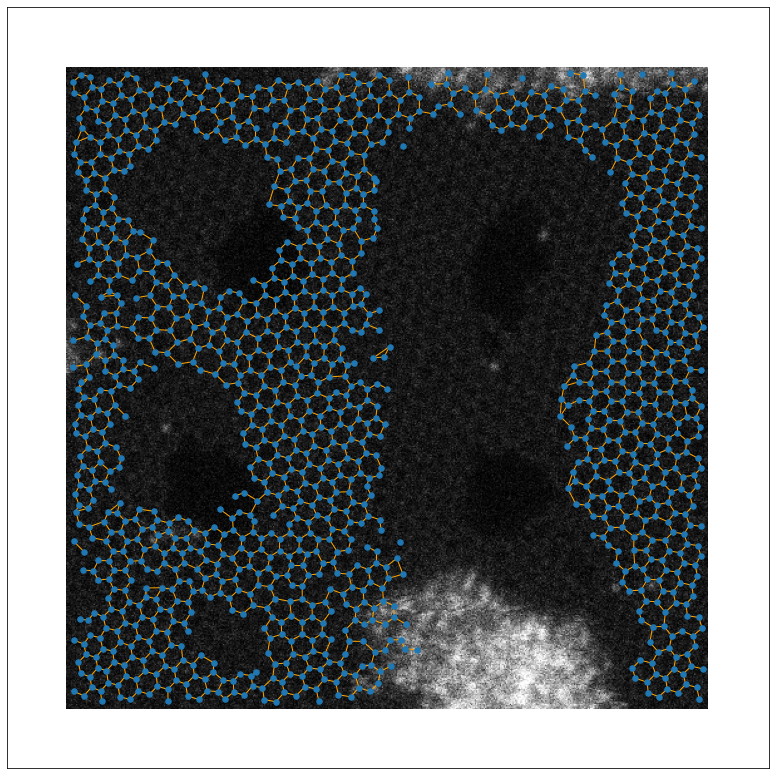

In [ ]:
coord = lattice_coord[49]  # Lattice coordinates of one frame
g = aoi.utils.Graph(coord, map_dict=map_dict)  # initializing a graph of atoms
g.find_neighbors(expand = 8.5, max_neighbors = 3)   # Forming the edges based on a distance threshold
aoi.utils.plot_graph(g, STEM_real[1,...,0], fsize = 14)   # Visualizing the formed graph

g.polycount(max_depth=7)   # getting the number of cycles/rings from the graph
g.remove_filled_polygons()

In [ ]:
# Now for each frame, we create a dummy channel
# For each of [5,6,7] membered rings detected, the ring's center pixel is populated using the number of nodes in this ring
cycles = []  
ring_img = np.zeros_like(decoded_imgs[49,:,:,0])  # Dummy channel
for ring in g.rings:
    if len(ring) in [5,6,7]:
        c1, c2 = 0, 0
        for ver in ring:
            c1 += ver.pos[0]
            c2 += ver.pos[1]
        ring_img[int(c1/len(ring)), int(c2/len(ring))] = len(ring)   # populating the dummy channel
        cycles.append([int(c1/len(ring)), int(c2/len(ring)), len(ring)])

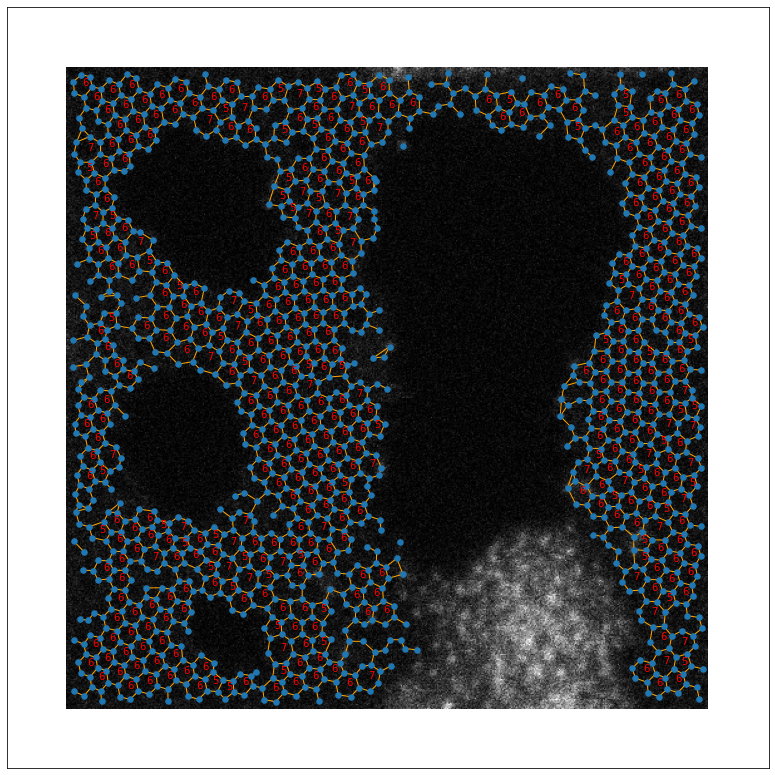

In [ ]:
# visulaizing the STEM images with the rings detected
fsize = (14,14)
_, ax = plt.subplots(1, 1, figsize=fsize)

G = g.nx_graph()
for k, v in nx.get_node_attributes(G, 'pos').items():
    G.nodes[k]['pos'] = v[::-1]
pos = nx.get_node_attributes(G, 'pos')

ax.imshow(STEM_real[49, :, :, 0], origin="lower", cmap="gray")
nx.draw_networkx_nodes(
    G, pos=pos, nodelist=G.nodes(), ax=ax,
    node_size=30,
    node_color="#1f78b4",
    alpha=None)
nx.draw_networkx_edges(
    G, pos, width=1, ax=ax,
    edge_color="orange",
    alpha= None)

for cyc in cycles:
    ax.annotate(cyc[2], (cyc[1], cyc[0]), fontsize=10, c = 'r')

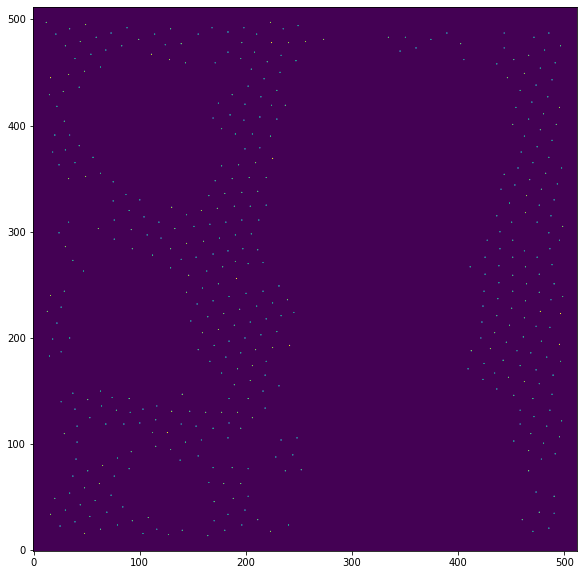

In [ ]:
# Visulaizing the dummy channel that was discussed above
plt.figure(figsize = (10,10))
plt.imshow(ring_img, origin = 'lower')
# plt.imshow(STEM_real)

# Getting the rings from all the frames and preparing the training dataset
Here, we repeat the proecess for all the frames in the dataset





In [ ]:
ring_imgs = np.zeros_like(STEM_real)
all_cycles = []
for i in range(len(lattice_coord)):
    coord = lattice_coord[i]
    g = aoi.utils.Graph(coord, map_dict=map_dict)
    g.find_neighbors(expand = 8.5, max_neighbors = 3)
    g.polycount(max_depth=7)
    g.remove_filled_polygons()

    cycles = []
    
    for ring in g.rings:
        if len(ring) in [3,4,5,6,7]:
            c1, c2 = 0, 0
            for ver in ring:
                c1 += ver.pos[0]
                c2 += ver.pos[1]
            ring_imgs[i, int(c1/len(ring)), int(c2/len(ring)), 0] = len(ring)
            cycles.append([int(c1/len(ring)), int(c2/len(ring)), len(ring)])

    all_cycles.append(cycles)

In [ ]:
# We concatenate the decoded images with the images that contain the information about the rings (dummy channel)
# The first channel will be used as the input to the ssrvae and the second channel will be used to generate labels
imgs_c = np.concatenate((np.sum(decoded_imgs[..., :-1], -1)[..., None], ring_imgs), axis = -1)

In [ ]:
# Getting feature vectors
# Feature vectors here are the cropped images around the coordinates found by DCNN. The window_size of these cropped images can be changed below
window_size = 42
s = aoi.stat.imlocal(
    imgs_c, # convert to a single channel (no background)
    lattice_coord, window_size, 0)

imstack_c = s.imgstack
print(imstack_c.shape)
frames_all = s.imgstack_frames # will need for plotting VAE results
com_all = s.imgstack_com # will need for plotting VAE results

(73192, 42, 42, 2)


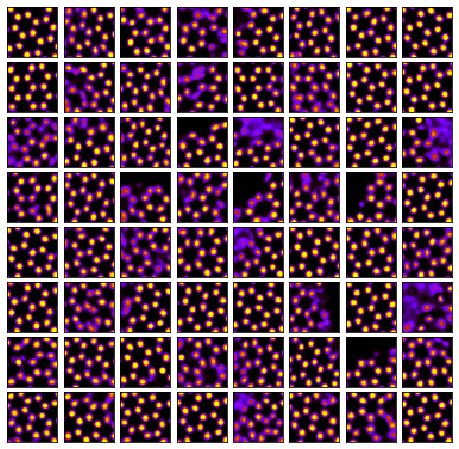

In [ ]:
# Visulaizing the subimages
np.random.seed(1)  # fix seed so that we get the same samples displayed at every run
fig, axes = plt.subplots(8, 8, figsize=(8, 8),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))

for ax in axes.flat:
    i = np.random.randint(len(imstack_c))
    ax.imshow(imstack_c[i, ..., 0], cmap='gnuplot', interpolation='nearest')

In [ ]:
#@title Function that labels the sub-images based on the number, type of rings detected in a sub image
# It uses the information from the dummy channel to understand the details of the rings present in the dummy-channel

def get_labels(stack):
    """stack corresponds to the images concatanated with ring information"""
    lab = -5*np.ones(len(stack))
    total_rings = []

    # We will start the labeling here   
    for i, im in enumerate(stack):
        im_d, im_r = im[:,:,0], im[:,:,1] #correspond to decoded and ring imgs respectively
        im_r_crop = im_r[8:32, 8:32]
        crop_cen = [12, 12]
    # We will ignore the image with 3 or 4 membered rings present
        if np.sum(im_r_crop==3) + np.sum(im_r_crop==4) == 0:

        # We will only consider [5,6,7] membered rings
            num_rings = np.sum(im_r_crop >= 5)
            
            if num_rings>3:
                #we only consider the closest 3 rings
                ring_cens = np.argwhere(im_r_crop >= 5)
                dists = np.abs(ring_cens[:,0] - crop_cen[0] + 1j*(ring_cens[:,0] - crop_cen[0]))
                sort_dists = np.argsort(dists)
                for k in sort_dists[3::]:
                    im_r_crop[ring_cens[k,0], ring_cens[k,1]] = 0
                
            num_rings = np.sum(im_r_crop >= 5)
            total_rings.append(num_rings)
            # We will use images that produce at least 500 images 
            if num_rings == 1:
                # The zeroth class will correspond to images with one ring
                lab[i] = 0
            elif num_rings == 2:
                if np.sum(im_r_crop == 6) == 2:
                    # Class-1 correspond to two 6,6 rings
                    lab[i] = 1
                if np.sum(im_r_crop==5) == 1 and np.sum(im_r_crop==6) == 1:
                    # Class-2 correspond to two 5,6 rings
                    lab[i] = 2
            elif num_rings == 3:
                if np.sum(im_r_crop==6) == 2 and np.sum(im_r_crop==7) == 1:
                    # Class-3 correspond to 6,6,7 rings
                    lab[i] = 3
                if np.sum(im_r_crop==6) == 3:
                    # Class-4 correspond to 6,6,6 rings
                    lab[i] = 4
                if np.sum(im_r_crop==5) == 1 and np.sum(im_r_crop==6) == 1 and np.sum(im_r_crop==7) == 1:
                    # Class-5 correspond to 5,6,7 rings
                    lab[i] = 5
                if np.sum(im_r_crop==5) == 1 and np.sum(im_r_crop==6) == 2:
                    # Class-6 correspond to 5,6,6 rings
                    lab[i] = 6
            
            # else:
            #     rings_ = [np.sum(im_r_crop == 5), np.sum(im_r_crop == 6), np.sum(im_r_crop == 7)]
            #     two_rings.append(rings_)
    return lab

In [ ]:
lab_all = get_labels(imstack_c)  # Getting the labels for all the sub-images

# Indices which are used for training(unfit inds) and the indices that are omitted from training (fit inds)
# The sub-images omitted from training are the ones that do not fall into the classes we have considered in the function above
unfit_inds = np.where(lab_all == -5)[0]
fit_inds = np.where(lab_all != -5)[0]

# Printing number of images from each class
for k in np.unique(lab_all):
    print(str(k) + ':', np.sum(lab_all==k))

-5.0: 6902
0.0: 8183
1.0: 7137
2.0: 3302
3.0: 3298
4.0: 35996
5.0: 4089
6.0: 4285


In [ ]:
# Preparing the training dataset and filtering out the unfit indices
imstack_train = tt(imstack_c[fit_inds][...,0][:, None])
labels_train = lab_all[fit_inds]
frames_train = frames_all[fit_inds] 
com_train = com_all[fit_inds]
lab_train = pv.utils.to_onehot(tt(labels_train).to(torch.int64), 7)  # One hot encoded

# Visualizing the images from each class

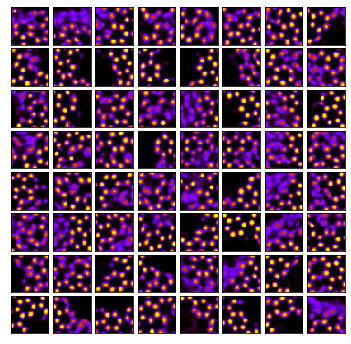

In [ ]:
# Class-0 : Fewer than 2 rings
# Visulaizing the subimages
zeroth_class = imstack_train[labels_train == 0]
np.random.seed(1)  # fix seed so that we get the same samples displayed at every run
fig, axes = plt.subplots(8, 8, figsize=(6, 6),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))

for i, ax in enumerate(axes.flat):
    i = np.random.randint(len(zeroth_class))
#     ax.set_title(str(i), c = 'olive')
    ax.imshow(zeroth_class[i, 0], cmap='gnuplot', interpolation='nearest')

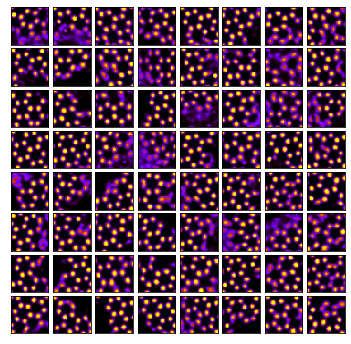

In [ ]:
# Class-1 : 2 rings : 6,6
# Visulaizing the subimages
first_class = imstack_train[labels_train == 1]
np.random.seed(1)  # fix seed so that we get the same samples displayed at every run
fig, axes = plt.subplots(8, 8, figsize=(6, 6),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))

for i, ax in enumerate(axes.flat):
    i = np.random.randint(len(first_class))
#     ax.set_title(str(i), c = 'olive')
    ax.imshow(first_class[i, 0], cmap='gnuplot', interpolation='nearest')

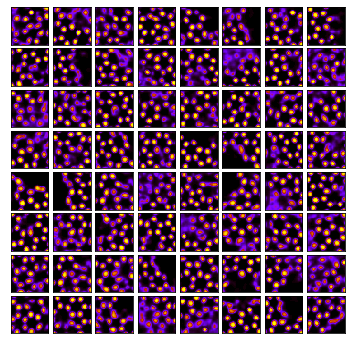

In [ ]:
# Class-2 : 2 rings : 5,6
second_class = imstack_train[labels_train == 2]
np.random.seed(1)  # fix seed so that we get the same samples displayed at every run
fig, axes = plt.subplots(8, 8, figsize=(6, 6),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))

for i, ax in enumerate(axes.flat):
    i = np.random.randint(len(second_class))
#     ax.set_title(str(i), c = 'olive')
    ax.imshow(second_class[i, 0], cmap='gnuplot', interpolation='nearest')

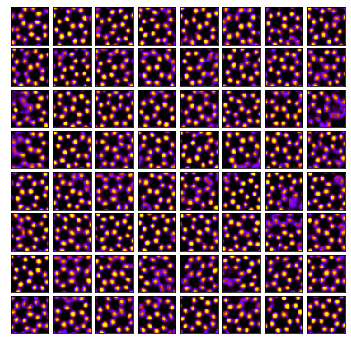

In [ ]:
# Class-3 : 3 rings : 6,6,7
third_class = imstack_train[labels_train == 3]
np.random.seed(1)  # fix seed so that we get the same samples displayed at every run
fig, axes = plt.subplots(8, 8, figsize=(6, 6),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))

for i, ax in enumerate(axes.flat):
    i = np.random.randint(len(third_class))
    ax.imshow(third_class[i, 0], cmap='gnuplot', interpolation='nearest')

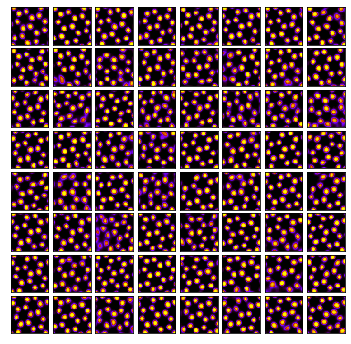

In [ ]:
# Class-4 : 3 rings : 6,6,6
fourth_class = imstack_train[labels_train == 4]
fourth_class.shape
np.random.seed(1)  # fix seed so that we get the same samples displayed at every run
fig, axes = plt.subplots(8, 8, figsize=(6, 6),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))

for i, ax in enumerate(axes.flat):
    i = np.random.randint(len(fourth_class))
    ax.imshow(fourth_class[i, 0], cmap='gnuplot', interpolation='nearest')

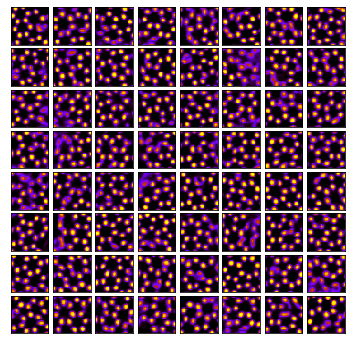

In [ ]:
# Class-5 : 3 rings : 5,6,7
fifth_class = imstack_train[labels_train == 5]
np.random.seed(1)  # fix seed so that we get the same samples displayed at every run
fig, axes = plt.subplots(8, 8, figsize=(6, 6),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))

for i, ax in enumerate(axes.flat):
    i = np.random.randint(len(fifth_class))
    ax.imshow(fifth_class[i, 0], cmap='gnuplot', interpolation='nearest')

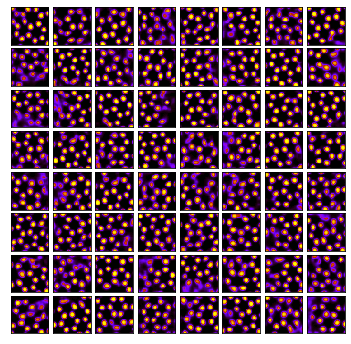

In [ ]:
# Class-6 : 3 rings : 5,6,6
sixth_class = imstack_train[labels_train == 6]
np.random.seed(1)  # fix seed so that we get the same samples displayed at every run
fig, axes = plt.subplots(8, 8, figsize=(6, 6),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))

for i, ax in enumerate(axes.flat):
    i = np.random.randint(len(sixth_class))
    ax.imshow(sixth_class[i, 0], cmap='gnuplot', interpolation='nearest')

# Training the crVAE

In [ ]:
#Initializing the train loader
train_loader = pv.utils.init_dataloader(imstack_train, lab_train, batch_size=50)

in_dim = (42, 42)   # Input dimensions of the dataset i.e., shape of each card's image

# Initialize probabilistic VAE model ->
# (invariances=None: vanilla VAE
#  invariances=['r']: enforces rotational invariance
#  invariances=['t']: enforces translational invariance
#  invariances=['r', 't']: enforces invariance to rotations & translations
#  etc.)
crvae_graphene = pv.models.iVAE(in_dim, latent_dim=2,   # Number of latent dimensions other than the invariancies and class labels
                                c_dim = 7,   # Corresponds to the number of discrete classes in the dataset, these get concatenated to the encoder and decoder automaticall
                      hidden_dim_e = [512,512],   # corresponds to the number of neurons in the hidden layers of the encoder
                     hidden_dim_d = [512,512],   # corresponds to the number of neurons in the hidden layers of the decoder
                     invariances=['r','t'], seed=0)

# Initialize SVI trainer
trainer_graphene = pv.trainers.SVItrainer(crvae_graphene)
# Train for n epochs:
for e in range(100):
    trainer_graphene.step(train_loader)
    trainer_graphene.print_statistics()


# Saving the weights
crvae_graphene.save_weights('crave_graphene_80')

Epoch: 1 Training loss: 833.1877
Epoch: 2 Training loss: 584.5877
Epoch: 3 Training loss: 534.0080
Epoch: 4 Training loss: 527.0234
Epoch: 5 Training loss: 522.3468
Epoch: 6 Training loss: 518.2271
Epoch: 7 Training loss: 516.2287
Epoch: 8 Training loss: 514.3908
Epoch: 9 Training loss: 515.9563
Epoch: 10 Training loss: 510.3022
Epoch: 11 Training loss: 510.3789
Epoch: 12 Training loss: 508.6452
Epoch: 13 Training loss: 508.5234
Epoch: 14 Training loss: 507.9815
Epoch: 15 Training loss: 506.5998
Epoch: 16 Training loss: 506.5640
Epoch: 17 Training loss: 505.7177
Epoch: 18 Training loss: 504.9888
Epoch: 19 Training loss: 505.3801
Epoch: 20 Training loss: 504.2027
Epoch: 21 Training loss: 503.9844
Epoch: 22 Training loss: 503.9058
Epoch: 23 Training loss: 502.0196
Epoch: 24 Training loss: 502.7558
Epoch: 25 Training loss: 502.0800
Epoch: 26 Training loss: 502.1201
Epoch: 27 Training loss: 501.4468
Epoch: 28 Training loss: 502.0438
Epoch: 29 Training loss: 501.2043
Epoch: 30 Training loss

# Visualizing the results

In [ ]:
# Initializing a new network
in_dim = (42, 42)

# Initialize probabilistic VAE model ->
# (invariances=None: vanilla VAE
#  invariances=['r']: enforces rotational invariance
#  invariances=['t']: enforces translational invariance
#  invariances=['r', 't']: enforces invariance to rotations & translations
#  etc.)
crvae_graphene = pv.models.iVAE(in_dim, latent_dim=2, c_dim = 7, 
                      hidden_dim_e = [512,512],
                     hidden_dim_d = [512,512],
                     invariances=['r','t'], seed=0)

# Download the weigths file 
!gdown 1bBgwpoL1YHVfUhLAdpuDXANaIgMepGPB

# Loading the saved weights into the newly initialized network
crvae_graphene.load_weights('crvae_graphene_80.pt')

Downloading...
From: https://drive.google.com/uc?id=1bBgwpoL1YHVfUhLAdpuDXANaIgMepGPB
To: /content/crvae_graphene_80.pt
100% 6.83M/6.83M [00:00<00:00, 56.3MB/s]


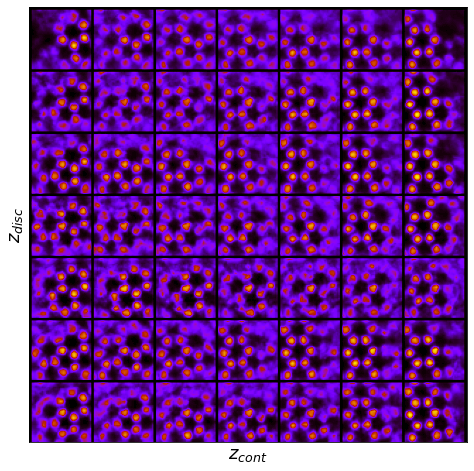

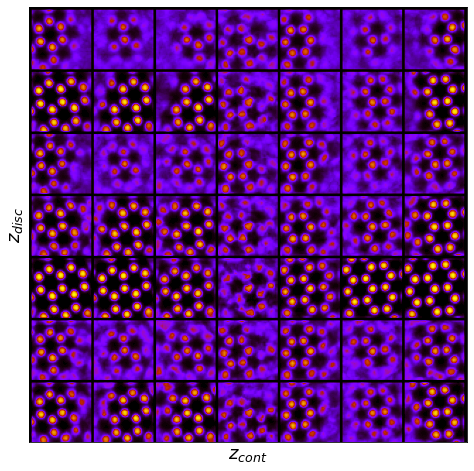

In [ ]:
# Decoded latent space:
# The latent space is uniformly sampled in z1-z2 latent dimensions. 
# These points are decoded back into the image space and are plotted in their corresponding latent space positions
# Since the latent space of crVAE is conditioned on the class label, we get one latent space for each class

# Traverse manifold is the decoded latent space in which one of the continouous latent dimension is held at constant (0),
# While the other continuous dimensions and the discrete dimension are used to plot the decoded latent space.
for i in range(2):
    crvae_graphene.manifold_traversal(7, i, cmap='gnuplot')

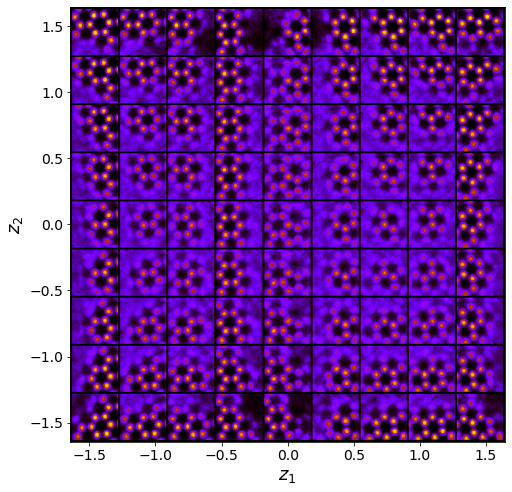

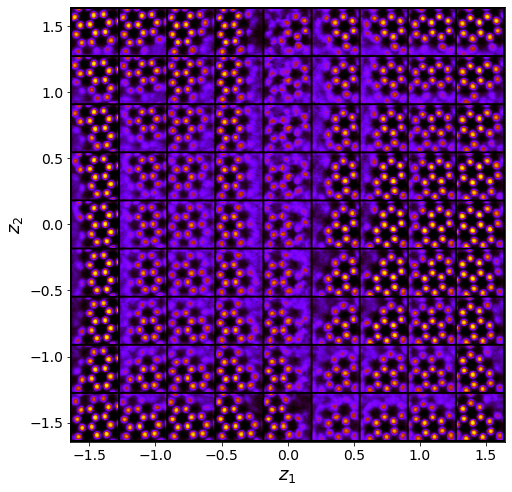

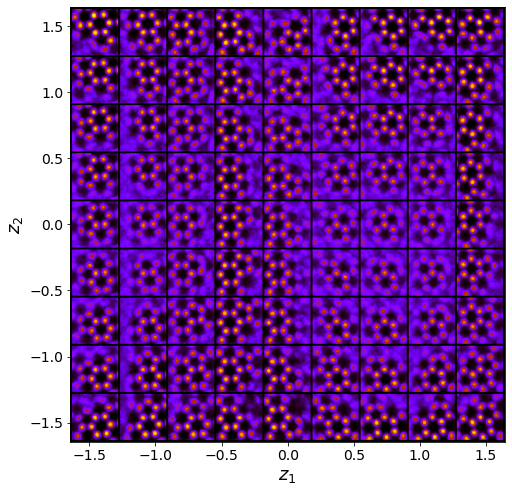

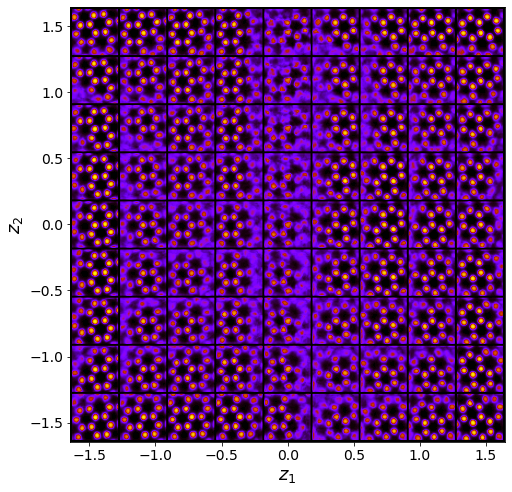

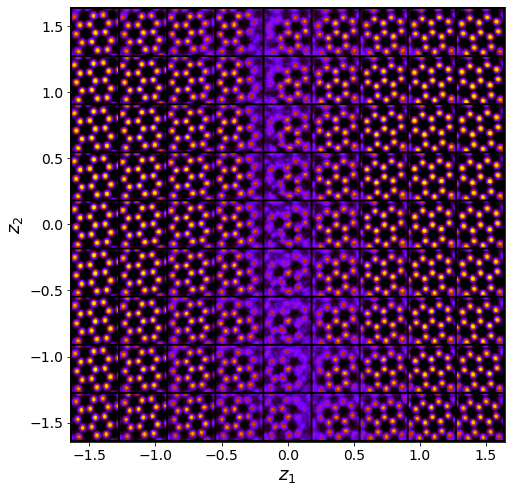

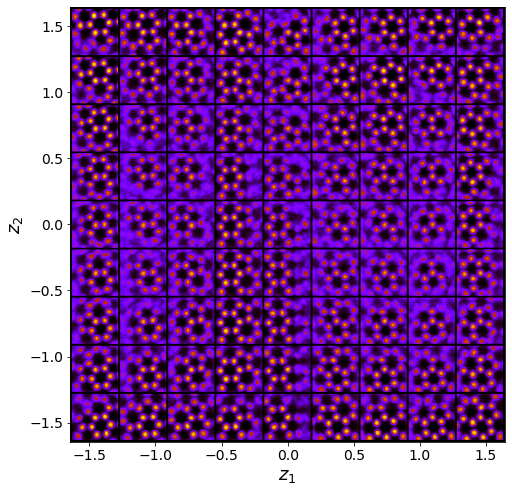

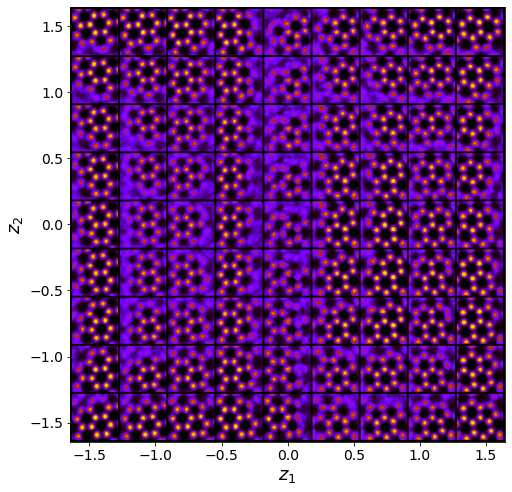

In [ ]:
# Decoded latent space of each class
for cls in range(7):
    cls = pv.utils.to_onehot(tt([cls,]), 7)
    crvae_graphene.manifold2d(d=9, y=cls, cmap="gnuplot")

In [ ]:
z_mean, z_sd = crvae_graphene.encode(imstack_train, lab_train)# Encoding the full input dataset
# z_mean2: mean of the latent space representation of the input dataset, 
# z_sd2: standard deviation of the latent space representation of the input dataset,
# 0th column corresponds to angle and then the regular latent dimensions (First invariant dimensions and then regular latent dimensions) 


# 0th column (z1): corresponds to angle and 
# 1st columsn (z2): Corresponds to the translations
# (z3) then the regular latent dimensions 
z1, z2, z3 = z_mean[:,0], z_mean[:, 1:3], z_mean[:, 3:]

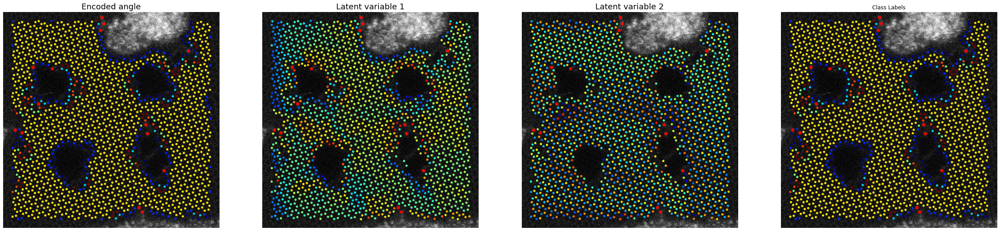

In [ ]:
# Plotting the latent variables in on the image data
#Visualizing the latent space encodings on the raw STEM image

frame = 0 # select frame
lab_i = np.argmax(lab_train[frames_train == frame], axis= 1)
com_i = com_train[frames_train == frame] # get coordinates for this frame
com_i_Si = lattice_coord[frame] # get Si coordinates for plotting
com_i_Si = com_i_Si[com_i_Si[:,-1]==1.]
z1_i = z1[frames_train == frame] # get latent variables (image) for this frame
z3_i = z3[frames_train == frame] # get latent variables (image) for this frame

col_min0 = z1.min()
col_max0 = z1.max()
col_min1 = z3[:, 0].min()
col_max1 = z3[:, 0].max()
col_min2 = z3[:, 1].min()
col_max2 = z3[:, 1].max()

fig, ax = plt.subplots(1, 4, figsize=(40, 10))
ax[0].imshow(STEM_real[frame,...,0], cmap="gray")
ax[0].scatter(com_i[:, 1], com_i[:, 0], c=lab_i, s=15,
            cmap="jet")

ax[0].set_title("Encoded angle", fontsize=18)
ax[1].imshow(STEM_real[frame,...,0], cmap="gray")
ax[1].scatter(com_i[:, 1], com_i[:, 0], c=z3_i[:, 0], s=15,
            cmap="jet", vmin=col_min1, vmax=col_max1)
ax[1].set_title("Latent variable 1", fontsize=18)
ax[2].imshow(STEM_real[frame,...,0], cmap="gray")
ax[2].scatter(com_i[:, 1], com_i[:, 0], c=z3_i[:, 1], s=15,
              cmap="jet", vmin=col_min2, vmax=col_max2)
ax[2].set_title("Latent variable 2", fontsize=18)

ax[3].imshow(STEM_real[frame,...,0], cmap="gray")
ax[3].scatter(com_i[:, 1], com_i[:, 0], c=lab_i, s=15,
            cmap="jet")
ax[3].set_title('Class Labels')
for _ax in fig.axes:
    _ax.scatter(com_i_Si[:, 1], com_i_Si[:, 0], s=35, c='Red')
    _ax.axis(False)
plt.show()

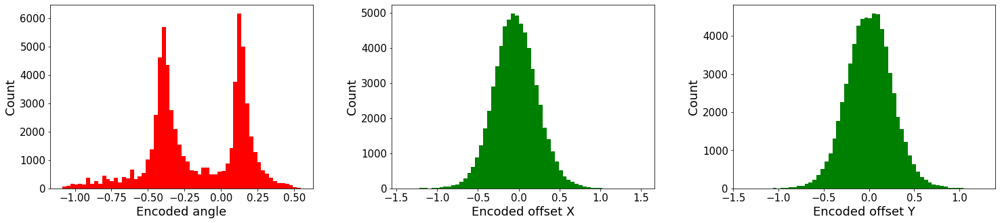

In [ ]:
# Histograms of the encoded angle and the translations

fig, ax = plt.subplots(1, 3, figsize=(25, 5))
ax[0].hist(z1, bins=60, color='red')
ax[1].hist(z2[:, 0], bins=60, color='green')
ax[2].hist(z2[:, 1], bins=60, color='green')
ax[0].set_xlabel("Encoded angle", fontsize=18)
ax[1].set_xlabel("Encoded offset X", fontsize=18)
ax[2].set_xlabel("Encoded offset Y", fontsize=18)
for _ax in fig.axes:
    _ax.set_ylabel("Count", fontsize=18)
    _ax.tick_params(labelsize=15)
plt.subplots_adjust(wspace=0.3)